By: Arun Agarwal

# Importing Libraries

In [2]:
!pip install emoji

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 590.6/590.6 kB 12.4 MB/s eta 0:00:00


In [3]:
import os
import re
import string
import emoji
import json
import numpy as np
import pandas as pd

import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import linkage
from scipy.spatial.distance import pdist
from wordcloud import WordCloud
from IPython.display import Image

import warnings
warnings.filterwarnings("ignore")
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
%matplotlib inline

# Importing Data

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
train_data = pd.read_csv("drive/MyDrive/266_final_project/data/train.tsv", sep='\t', header=None, names=['Text', 'Class', 'ID'])
valid_data = pd.read_csv("drive/MyDrive/266_final_project/data/dev.tsv", sep='\t', header=None, names=['Text', 'Class', 'ID'])
test_data = pd.read_csv("drive/MyDrive/266_final_project/data/test.tsv", sep='\t', header=None, names=['Text', 'Class', 'ID'])

In [7]:
train_data.head()

,Text,Class,ID
0,My favourite food is anything I didn't have to...,27,eebbqej
1,"Now if he does off himself, everyone will thin...",27,ed00q6i
2,WHY THE FUCK IS BAYLESS ISOING,2,eezlygj
3,To make her feel threatened,14,ed7ypvh
4,Dirty Southern Wankers,3,ed0bdzj


In [8]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43410 entries, 0 to 43409
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Text    43410 non-null  object
 1   Class   43410 non-null  object
 2   ID      43410 non-null  object
dtypes: object(3)
memory usage: 1017.6+ KB


# Basic EDA

In [9]:
train_data['Class List'] = train_data['Class'].apply(lambda x: x.split(','))
train_data['Class Length'] = train_data['Class List'].apply(lambda x: len(x))

In [10]:
train_data['Class Length'].max()

5

In [11]:
train_data['Class Length'].value_counts()

,count
Class Length,
1,36308
2,6541
3,532
4,28
5,1


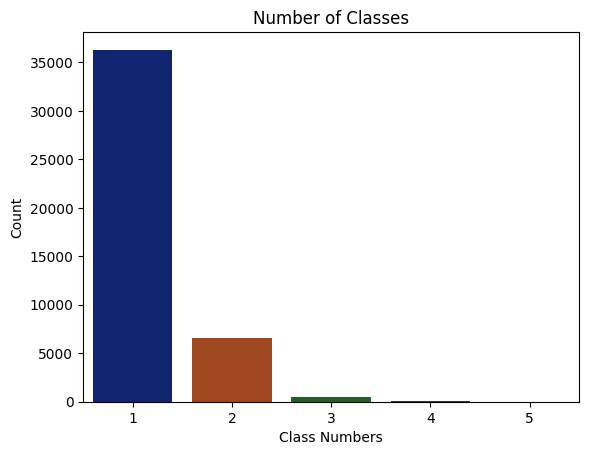

In [12]:
# Checking distribution of the number of labels for each piece of text
temp_df = train_data['Class Length'].value_counts().sort_index()
sns.barplot(x=list(range(1, train_data['Class Length'].max()+1)), y=temp_df, palette=sns.color_palette("dark", 10))
plt.title("Number of Classes")
plt.xlabel("Class Numbers")
plt.ylabel("Count")
plt.show()

In [13]:
emotions_map = {}
with open('drive/MyDrive/266_final_project/data/emotions.txt', 'r') as f:
    for i,emotion in enumerate(f):
        emotions_map[str(i)] = emotion.strip()

In [14]:
emotions_map

{'0': 'admiration',
 '1': 'amusement',
 '2': 'anger',
 '3': 'annoyance',
 '4': 'approval',
 '5': 'caring',
 '6': 'confusion',
 '7': 'curiosity',
 '8': 'desire',
 '9': 'disappointment',
 '10': 'disapproval',
 '11': 'disgust',
 '12': 'embarrassment',
 '13': 'excitement',
 '14': 'fear',
 '15': 'gratitude',
 '16': 'grief',
 '17': 'joy',
 '18': 'love',
 '19': 'nervousness',
 '20': 'optimism',
 '21': 'pride',
 '22': 'realization',
 '23': 'relief',
 '24': 'remorse',
 '25': 'sadness',
 '26': 'surprise',
 '27': 'neutral'}

In [15]:
# Mapping the classes into one hot vectors with multi-label
for i in emotions_map:
    train_data[emotions_map[i]] = train_data["Class List"].apply(lambda x: 1 if i in x else 0)

In [16]:
train_data.drop(['Class', 'Class List', 'Class Length'], axis=1, inplace =True)

In [17]:
train_data.head()

,Text,ID,admiration,amusement,anger,annoyance,approval,caring,confusion,curiosity,desire,disappointment,disapproval,disgust,embarrassment,excitement,fear,gratitude,grief,joy,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
0,My favourite food is anything I didn't have to...,eebbqej,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,"Now if he does off himself, everyone will thin...",ed00q6i,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,WHY THE FUCK IS BAYLESS ISOING,eezlygj,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,To make her feel threatened,ed7ypvh,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Dirty Southern Wankers,ed0bdzj,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


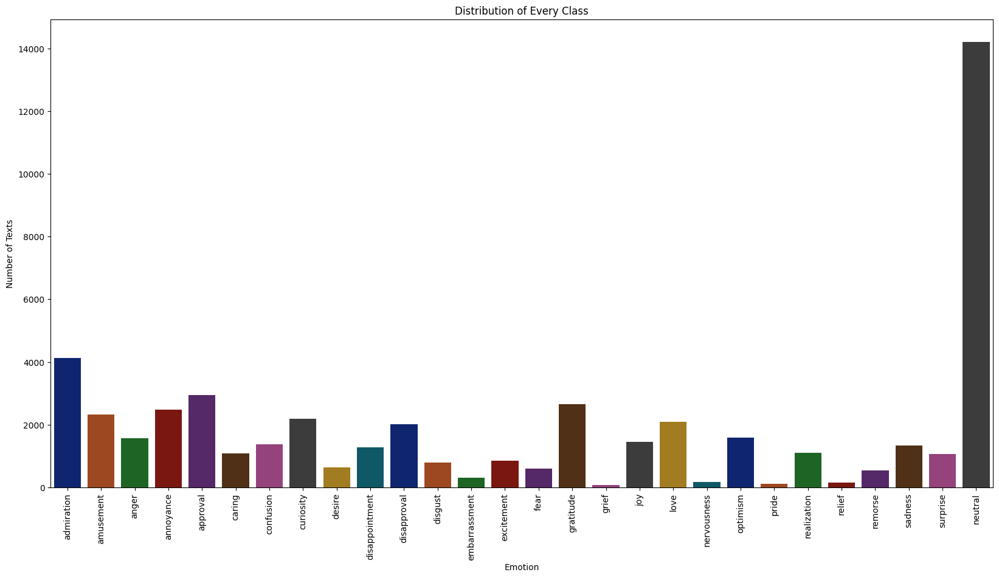

In [18]:
# Checking Distribution of Each Class (Multi-Label included)
emotion_list = list(emotions_map.values())
temp_list = train_data.drop(['Text', "ID"], axis=1).sum(axis=0).tolist()
plt.figure(figsize=(20,10))
sns.barplot(x=emotion_list, y=temp_list, palette=sns.color_palette("dark"))
plt.xticks(rotation="vertical")
plt.title("Distribution of Every Class")
plt.ylabel("Number of Texts")
plt.xlabel('Emotion')
plt.show()

In [19]:
print("Distribution of number of labels per example:")
print(train_data.drop(['Text', "ID"], axis=1).sum(axis=1).value_counts() / len(train_data))
print("%.2f with more than 3 labels" %
        ((train_data.drop(['Text', "ID"], axis=1).sum(axis=1) > 3).sum() /
         len(train_data)))

Distribution of number of labels per example:
1    0.836397
2    0.150680
3    0.012255
4    0.000645
5    0.000023
Name: count, dtype: float64
0.00 with more than 3 labels


In [20]:
train_data.columns

Index(['Text', 'ID', 'admiration', 'amusement', 'anger', 'annoyance',
       'approval', 'caring', 'confusion', 'curiosity', 'desire',
       'disappointment', 'disapproval', 'disgust', 'embarrassment',
       'excitement', 'fear', 'gratitude', 'grief', 'joy', 'love',
       'nervousness', 'optimism', 'pride', 'realization', 'relief', 'remorse',
       'sadness', 'surprise', 'neutral'],
      dtype='object')

In [21]:
column = train_data.columns
emotions_with_nuetral = column[2:]
emotions = column[2:-1]

positive_col = ['admiration','amusement','approval','caring','curiosity','excitement','gratitude','joy','love','optimism','relief','surprise']
negative_col = ['sadness','pride','fear','embarrassment','disapproval','disappointment','confusion','annoyance','anger','nervousness','desire']
ambiguous_col = ['remorse','realization','grief','disgust']
neutral_col = ['neutral']

In [22]:
print("Label distributions:")
label_distributions = (train_data[emotions_with_nuetral].sum(axis=0).sort_values(ascending=False)/len(train_data) * 100).round(2)
print(label_distributions)

Label distributions:
neutral           32.76
admiration         9.51
approval           6.77
gratitude          6.13
annoyance          5.69
amusement          5.36
curiosity          5.05
love               4.81
disapproval        4.66
optimism           3.64
anger              3.61
joy                3.34
confusion          3.15
sadness            3.05
disappointment     2.92
realization        2.56
caring             2.50
surprise           2.44
excitement         1.96
disgust            1.83
desire             1.48
fear               1.37
remorse            1.26
embarrassment      0.70
nervousness        0.38
relief             0.35
pride              0.26
grief              0.18
dtype: float64


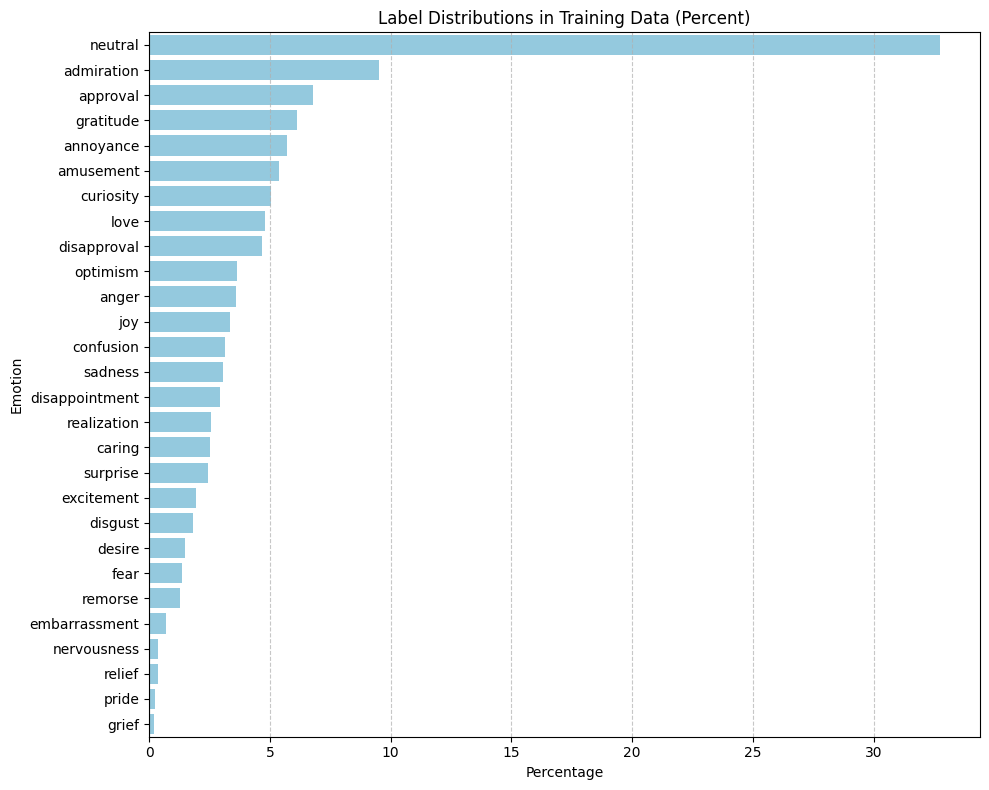

In [23]:
plt.figure(figsize=(10, 8))
sns.barplot(x=label_distributions.values, y=label_distributions.index, color='skyblue')
plt.xlabel('Percentage')
plt.ylabel('Emotion')
plt.title('Label Distributions in Training Data (Percent)')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [24]:
df_emotion = pd.DataFrame()
df_emotion['emotion'] = list(emotions_with_nuetral)
df_emotion['group'] = 'standalone'
df_emotion['group'].loc[df_emotion['emotion'].isin(positive_col)] = 'positive'
df_emotion['group'].loc[df_emotion['emotion'].isin(negative_col)] = 'negative'
df_emotion['group'].loc[df_emotion['emotion'].isin(ambiguous_col)] = 'ambiguous'
df_emotion.head()

,emotion,group
0,admiration,positive
1,amusement,positive
2,anger,negative
3,annoyance,negative
4,approval,positive


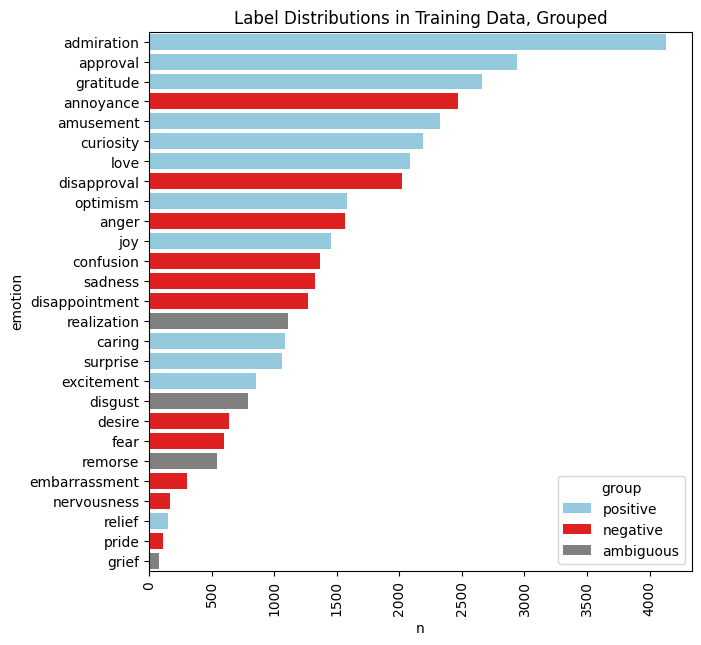

In [25]:
temp = train_data[emotions].sum(axis=0) \
    .reset_index() \
    .rename(columns={'index': 'emotion', 0: 'n'}) \
    .merge(df_emotion, how='left', on='emotion')\
    .sort_values('n', ascending=False)
temp = temp[temp['emotion'] != 'neutral']

fig, ax = plt.subplots(figsize=(7, 7))
ax.tick_params(axis='x', rotation=90)
palette ={
    "positive": "skyblue",
    "negative": "red",
    "ambiguous": 'gray'
}
sns.barplot(data=temp, x='n',
            y='emotion', hue='group',
            dodge=False,
            palette=palette,
            ax=ax)
plt.title('Label Distributions in Training Data, Grouped')
plt.show()

Text(0.5, 1.0, 'Label Distributions in Training Data per Group')

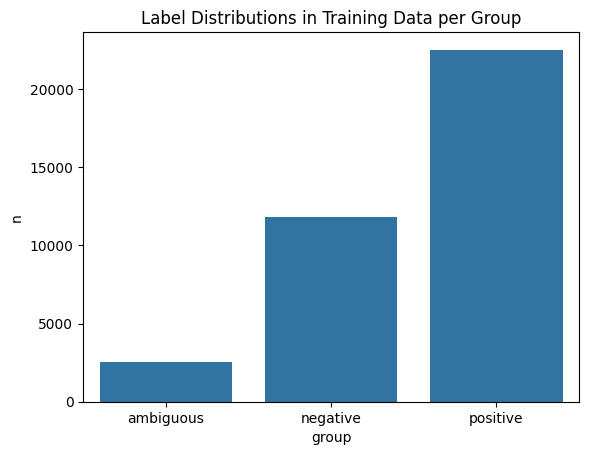

In [26]:
temp = temp.groupby('group') \
        .agg('sum').reset_index()
sns.barplot(data=temp, x='group', y='n')
plt.title('Label Distributions in Training Data per Group')

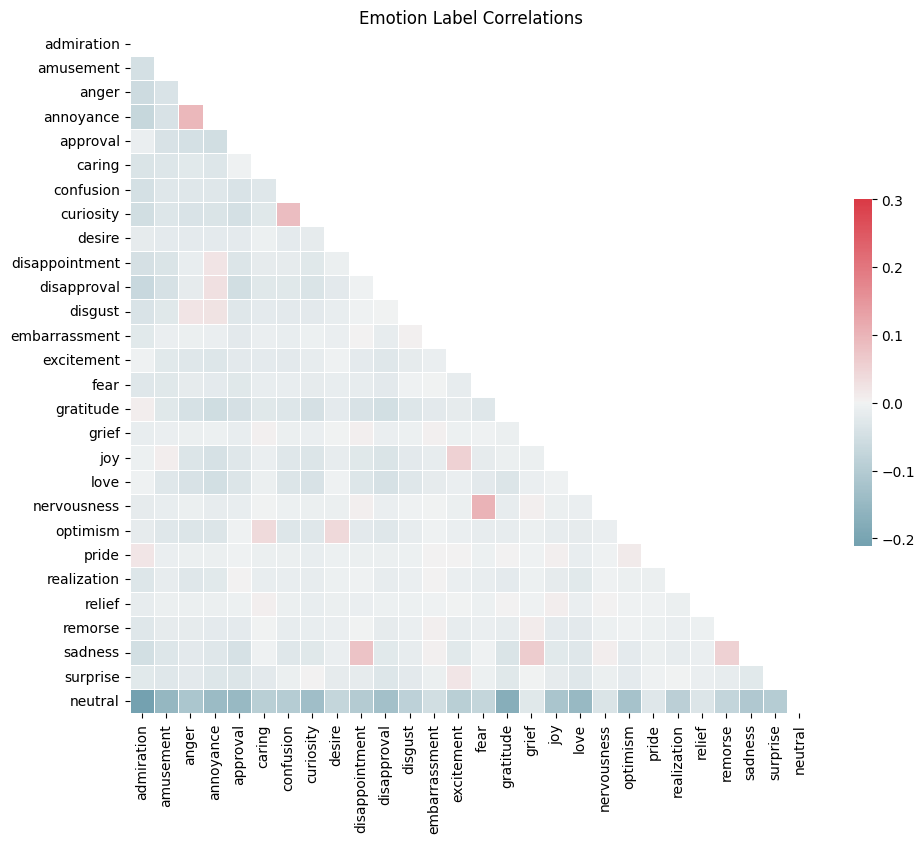

In [27]:
ratings = train_data.groupby("ID")[emotions_with_nuetral].mean()
corr = ratings.corr()
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
fig, _ = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(
      corr,
      mask=mask,
      cmap=cmap,
      vmax=.3,
      center=0,
      square=True,
      linewidths=.5,
      cbar_kws={"shrink": .5})
plt.title("Emotion Label Correlations")
plt.show()

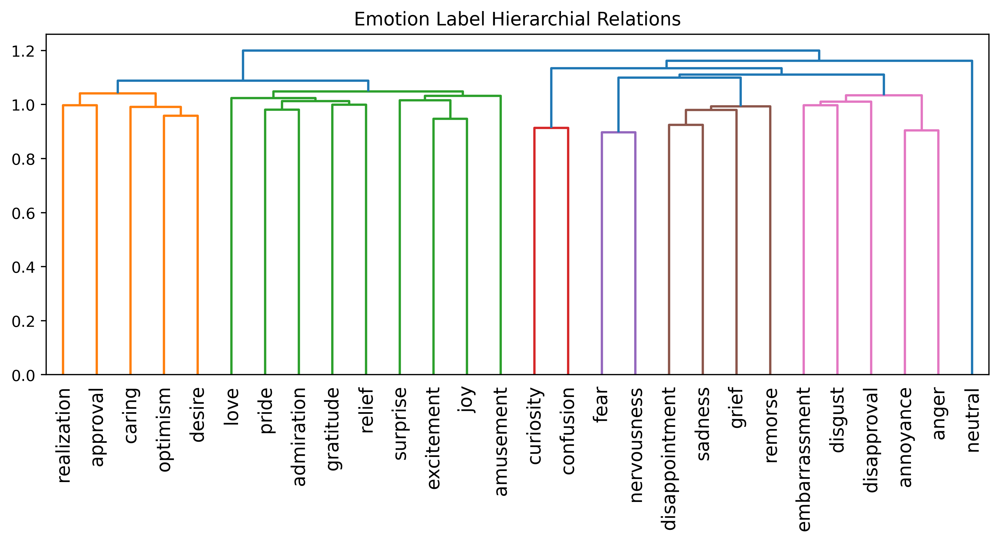

In [28]:
z = linkage(
      pdist(ratings.T, metric="correlation"),
      method="ward",
      optimal_ordering=True)
fig = plt.figure(figsize=(11, 4), dpi=400)
plt.xlabel("")
plt.ylabel("")
dendrogram(
      z,
      labels=ratings.columns,
      leaf_rotation=90.,  # rotates the x axis labels
      leaf_font_size=12,
      color_threshold=1.05,
  )
plt.title("Emotion Label Hierarchial Relations")
plt.show()

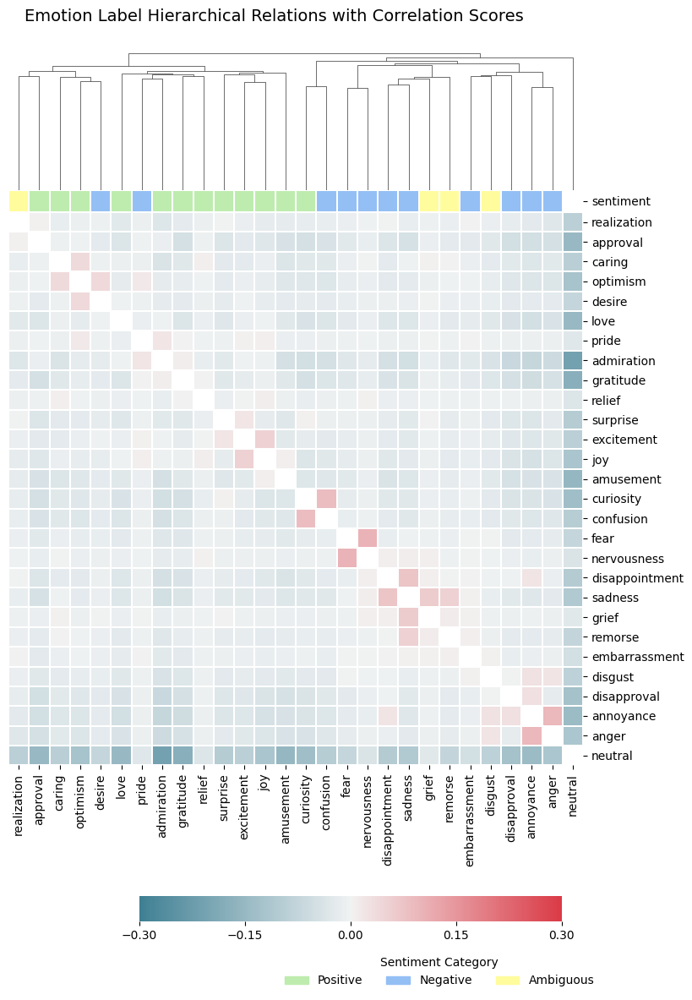

In [29]:
import matplotlib.patches as mpatches

# --- Your existing setup ---
sent_color_map = {
    "positive": "#BEECAF",
    "negative": "#94bff5",
    "ambiguous": "#FFFC9E"
}

sent_colors = {}
for emotion in emotions:
    if emotion in positive_col:
        sent_colors[emotion] = sent_color_map["positive"]
    elif emotion in negative_col:
        sent_colors[emotion] = sent_color_map["negative"]
    else:
        sent_colors[emotion] = sent_color_map["ambiguous"]

mask = np.zeros_like(corr, dtype=bool)
mask[np.diag_indices(mask.shape[0])] = True
cmap = sns.diverging_palette(220, 10, as_cmap=True)

row_colors = pd.Series(corr.columns, index=corr.columns, name="sentiment").map(sent_colors)

g = sns.clustermap(
    corr,
    mask=mask,
    cmap=cmap,
    vmax=.3,
    vmin=-0.3,
    center=0,
    row_linkage=z,
    col_linkage=z,
    col_colors=row_colors,
    linewidths=.1,
    cbar_kws={
        "ticks": [-.3, -.15, 0, .15, .3],
        "use_gridspec": False,
        "orientation": "horizontal",
    },
    figsize=(10, 10)
)

g.ax_row_dendrogram.set_visible(False)
g.cax.set_position([.34, -0.05, .5, .03])
g.fig.suptitle("Emotion Label Hierarchical Relations with Correlation Scores", fontsize=14, y=1.03)
legend_patches = [
    mpatches.Patch(color=color, label=label.capitalize())
    for label, color in sent_color_map.items()
]
g.fig.legend(
    handles=legend_patches,
    title="Sentiment Category",
    loc='upper left',
    bbox_to_anchor=(0.5, -0.08),
    ncol=3,
    frameon=False
)
plt.show()

In [30]:
emotion_list = list(emotions_map.values())

In [32]:
temp_list = train_data.drop(['Text'], axis=1).sum(axis=0).tolist()
trace1 = go.Bar(
                x = emotion_list,
                y = temp_list,
                marker = dict(color = 'rgb(127, 16, 238)',
                              line=dict(color='rgb(0,0,0)',width=1.5)),
                text=temp_list, textposition='outside')
layout = go.Layout(template= "plotly_dark",title = 'NUMBER OF EMOTIONS' , xaxis = dict(title = 'Emotion'), yaxis = dict(title = 'Count'))
fig = go.Figure(data = [trace1], layout = layout)
fig.show()

# WordCloud with Ekman Taxonomy

In [33]:
emotions_data = pd.read_csv("drive/MyDrive/266_final_project/data/emotion_words.csv")

In [34]:
emotions_data.head()

,emotion,word,odds,freq
0,admiration,great,41.80,0.014
1,admiration,awesome,31.18,0.007
2,admiration,amazing,29.65,0.006
3,admiration,good,26.87,0.016
4,admiration,beautiful,22.87,0.004


In [35]:
emotions_data["emotion"].value_counts()

,count
emotion,
neutral,174
admiration,138
approval,92
annoyance,82
gratitude,74
amusement,55
anger,53
disapproval,51
curiosity,45


In [37]:
with open('drive/MyDrive/266_final_project/data/ekman_mapping.json') as file:
    ekman_mapping = json.load(file)

In [38]:
ekman_mapping

{'anger': ['anger', 'annoyance', 'disapproval'],
 'disgust': ['disgust'],
 'fear': ['fear', 'nervousness'],
 'joy': ['joy',
  'amusement',
  'approval',
  'excitement',
  'gratitude',
  'love',
  'optimism',
  'relief',
  'pride',
  'admiration',
  'desire',
  'caring'],
 'sadness': ['sadness', 'disappointment', 'embarrassment', 'grief', 'remorse'],
 'surprise': ['surprise', 'realization', 'confusion', 'curiosity']}

In [39]:
for i in range(len(emotions_data)):
    if emotions_data.iloc[i,0] in ekman_mapping["anger"]:
        emotions_data.iloc[i,0] = "anger"
    elif emotions_data.iloc[i,0] in ekman_mapping["disgust"]:
        emotions_data.iloc[i,0] = "disgust"
    elif emotions_data.iloc[i,0] in ekman_mapping["fear"]:
        emotions_data.iloc[i,0] = "fear"
    elif emotions_data.iloc[i,0] in ekman_mapping["joy"]:
        emotions_data.iloc[i,0] = "joy"
    elif emotions_data.iloc[i,0] in ekman_mapping["sadness"]:
        emotions_data.iloc[i,0] = "sadness"
    elif emotions_data.iloc[i,0] in ekman_mapping["surprise"]:
        emotions_data.iloc[i,0] = "surprise"
    else:
        emotions_data.iloc[i,0] = "neutral"

In [40]:
emotions_data.head()

,emotion,word,odds,freq
0,joy,great,41.80,0.014
1,joy,awesome,31.18,0.007
2,joy,amazing,29.65,0.006
3,joy,good,26.87,0.016
4,joy,beautiful,22.87,0.004


In [41]:
emotions_data["emotion"].value_counts()

,count
emotion,
joy,545
anger,186
neutral,174
surprise,134
sadness,86
fear,30
disgust,23


In [42]:
wc_dict = {}
for i in emotions_data['emotion'].unique():
    wc_dict[i] = {}
    odds_list = emotions_data[emotions_data['emotion'] == i]['odds'].tolist()
    word_list = emotions_data[emotions_data['emotion'] == i]['word'].tolist()
    wc_dict[i] = dict(dict(zip(word_list,odds_list)))

In [43]:
wc_dict.keys()

dict_keys(['joy', 'anger', 'surprise', 'sadness', 'disgust', 'fear', 'neutral'])

In [44]:
def plot_cloud(wordcloud):
    plt.figure(figsize=(30, 20))
    plt.imshow(wordcloud)
    plt.axis("off");

In [45]:
wordcloud = WordCloud(width = 1000, height = 500, random_state=42, background_color='black', colormap='Set2', collocations=False)

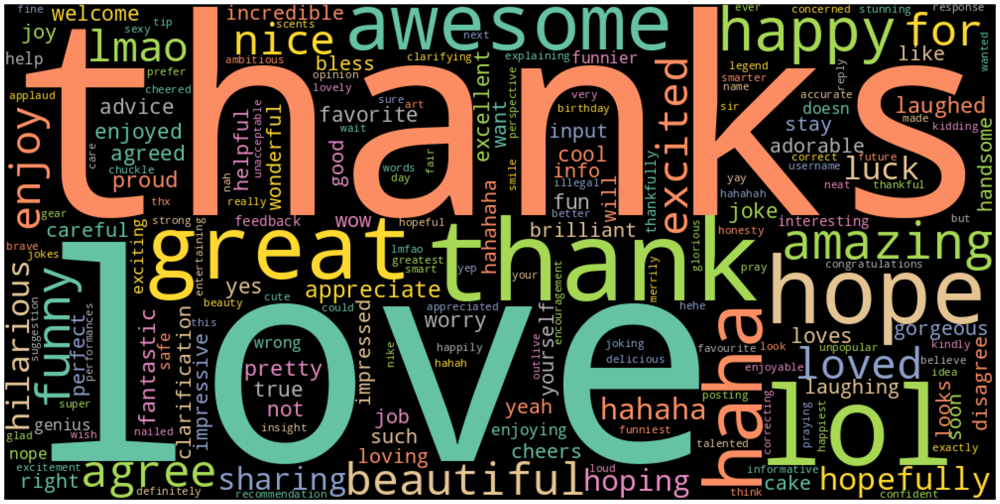

In [46]:
# Plotting WordCloud for Class ['joy', 'anger', 'surprise', 'sadness', 'disgust', 'fear', 'neutral'] respectively
plot_cloud(wordcloud.generate_from_frequencies(wc_dict['joy']))

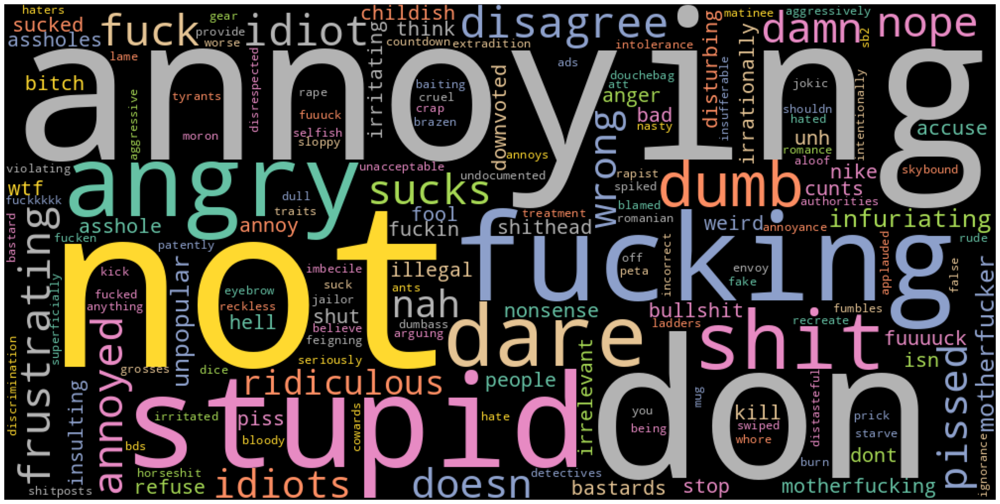

In [47]:
plot_cloud(wordcloud.generate_from_frequencies(wc_dict['anger']))

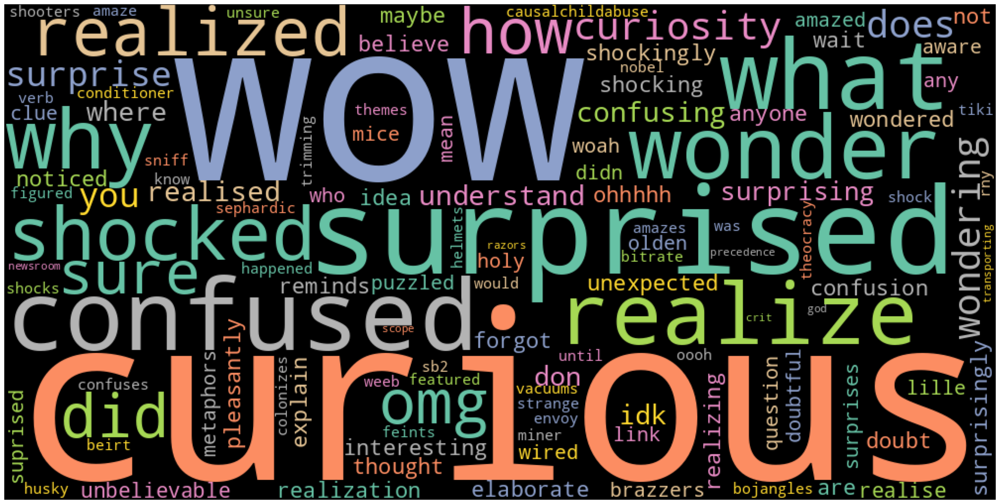

In [48]:
plot_cloud(wordcloud.generate_from_frequencies(wc_dict['surprise']))

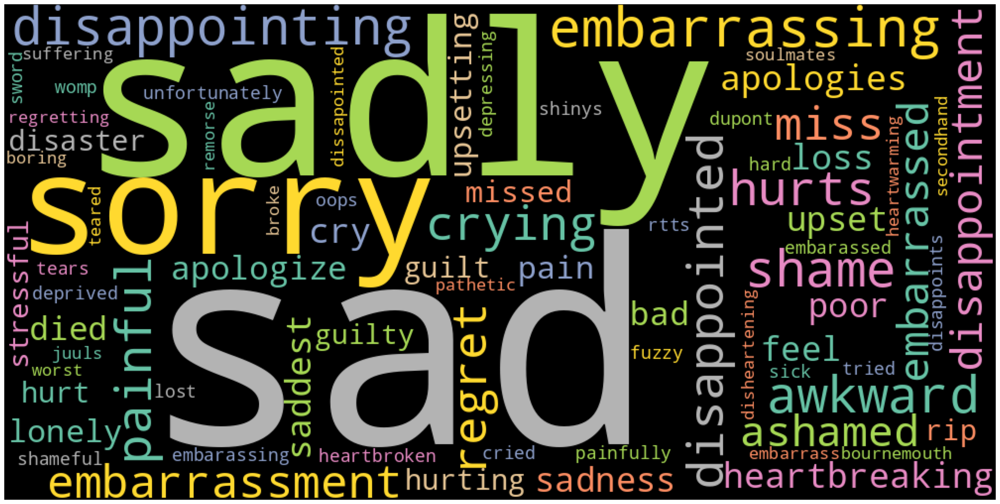

In [49]:
plot_cloud(wordcloud.generate_from_frequencies(wc_dict['sadness']))

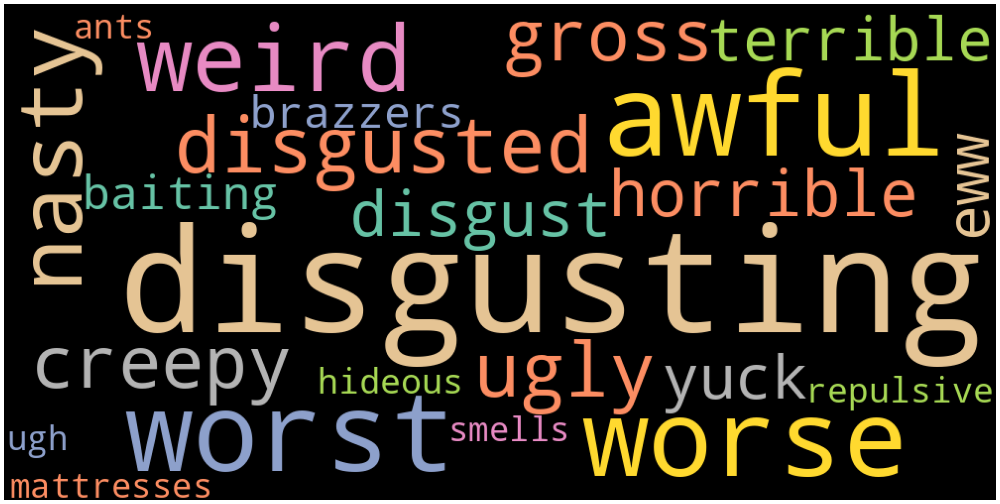

In [50]:
plot_cloud(wordcloud.generate_from_frequencies(wc_dict['disgust']))

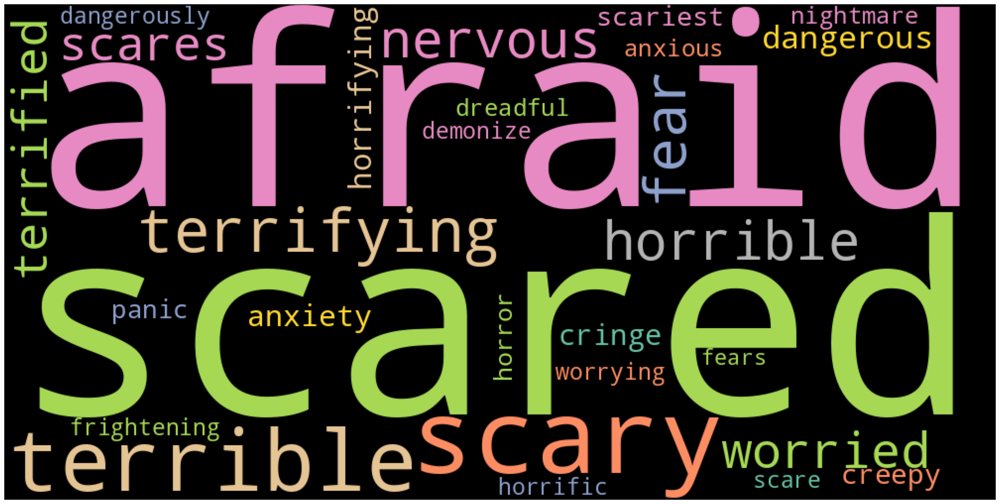

In [51]:
plot_cloud(wordcloud.generate_from_frequencies(wc_dict['fear']))

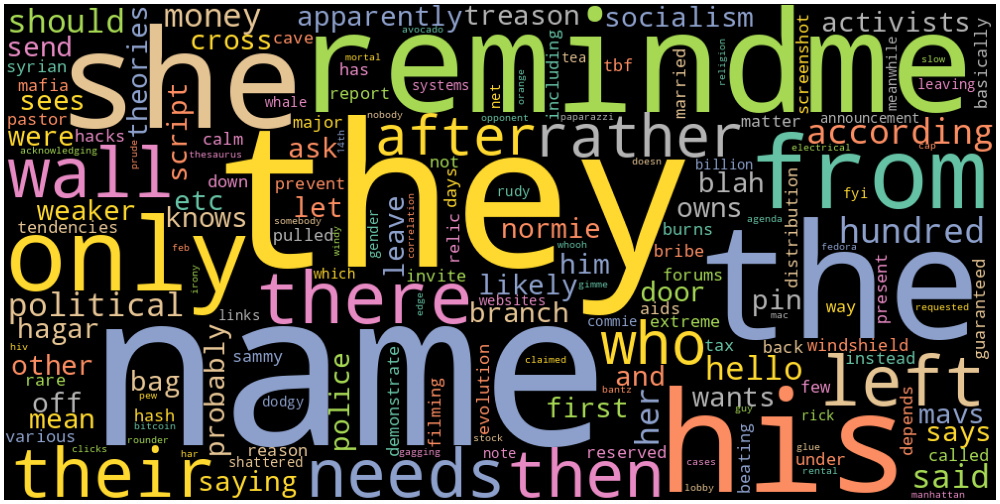

In [52]:
plot_cloud(wordcloud.generate_from_frequencies(wc_dict['neutral']))